<a href="https://colab.research.google.com/github/RafaelVieira13/Deep_Learning_Deployment/blob/main/Tomato_Rotness_Model_Deployment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 76.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 35.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 53.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 33.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 118.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 29.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

MessageError: ignored

In [ ]:
from fastbook import *
from fastai.vision.widgets import *

# 1. Gathering Data

In [ ]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

In [ ]:
ims = search_images_ddg("red tomato")
len(ims)

200

We´ve sucessfully downloaded the URLs of 200 mature tomatos

Let´s take a look at one

In [ ]:
dest = "images/red.jpg"
download_url(ims[0],dest, show_progress=False)

Path('images/red.jpg')

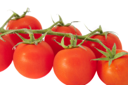

In [ ]:
im = Image.open(dest)
im.to_thumb(128,128)

This seems to have worked nicely, so let´s use fastai´s `download_images` to download all the URLs for each of our search terms folder:

In [ ]:
tomato_types = "red","green","rotten"
path = Path("tomatos")

In [ ]:
if not path.exists():
  path.mkdir()
  for o in tomato_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_ddg(f'{o} tomato')
    download_images(dest, urls = results)

Our folder has images files, as we´d except:

In [ ]:
fns = get_image_files(path)
fns

(#580) [Path('tomatos/red/c4475716-e478-4ce7-935b-1cd488a78ec8.png'),Path('tomatos/red/12276cf7-6fc9-4b5c-ad10-7bc1ccb814b5.jpg'),Path('tomatos/red/ca42d04c-2ce1-4f8d-b369-59e7ed6d00eb.jpeg'),Path('tomatos/red/9e11badd-a52d-4c6b-b33b-15c32a55e616.jpg'),Path('tomatos/red/0546a717-b7d3-4b5f-9daf-ade3a10d681b.jpg'),Path('tomatos/red/530eedd3-5f7d-4da8-b47e-a34ae21bb4e4.png'),Path('tomatos/red/a8853708-c55e-4618-89b1-ca23136d744b.jpg'),Path('tomatos/red/3f7e6557-2e55-4d31-94fc-ccbdd2baac0c.jpg'),Path('tomatos/red/606fe1c9-a4bf-4772-8423-ec6123951c97.jpg'),Path('tomatos/red/40a9a9a5-e07a-49b9-855b-94d99dec20ed.jpg')...]

Often when we download files from the internet, there are a few that are corrupt. Let´s check:

In [ ]:
failed = verify_images(fns)
failed

(#15) [Path('tomatos/red/17bd1db3-4e38-4ab7-b988-6fbf8a6cbec4.jpg'),Path('tomatos/red/bca5de50-e263-4ec1-9d6c-a0287b9b4a76.jpg'),Path('tomatos/red/4db078fd-5977-4597-acd3-f86182d21dce.jpg'),Path('tomatos/red/12ae7984-cba1-4c09-a1f4-4eff852ea5f2.jpg'),Path('tomatos/red/4af9c332-06ee-4249-8e3c-b10eef7fd2a0.jpg'),Path('tomatos/red/f826fec8-c6fa-481e-883f-793ceae78858.jpg'),Path('tomatos/red/63413868-6be0-48bd-ad1e-553c225c1c68.jpg'),Path('tomatos/green/346c0fbb-a967-4de0-9157-81af751fe80d.jpg'),Path('tomatos/green/746e86af-5356-4841-b9af-5390daa99791.jpg'),Path('tomatos/rotten/5209a441-3c3f-4b1d-bedb-e2f720bad9cd.jpg')...]

To remove all the images, you can use `unlink` on each of them. Note that, like most fastai functions that return collection, `verify_images` returns an object of type` L`, which includes the map method. This calls the passed function on each element of the collection

In [ ]:
failed.map(Path.unlink);

# 2. Cleaning the Model

**From Data to DataLoaders**

`DataLoaders` is a thin class that just stores whatever `DataLoader` objects you pass to it, and makes them available as `train` and `valid`. Although it´s a very simple class, it´s very important in fastai: it provides the data for your model. The key functionality in `DataLoaders` is provided with just four lines of code 8it has some other minor functionality we´ll skip over for now):



In [ ]:
class DataLoaders(GetAttr):
  def _init_(self, *loaders): self.loaders = loaders
  def _getitem_(self, i): return self.loaders[i]
  train,valid = add_props(lambda i, self: self[i])

To turn our downloaded data into a DataLoaders object we need to tell fastai at least four things:

* What kinds of data we are working with
* How to get the list of items
* How to label these items
* How to create the validation set

So far we have seen a number of factory methods for particular combinations of these things, which are convenient when you have an application and data structure that happen to fit into those predefined methods. For when you don't, fastai has an extremely flexible system called the data block API. With this API you can fully customize every stage of the creation of your DataLoaders. Here is what we need to create a DataLoaders for the dataset that we just downloaded:

In [ ]:
tomatos = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct = 0.2, seed = 43),
    get_y = parent_label,
    item_tfms = Resize(128)
)

This command has given us a DataBlock object. This is like a template for creating a DataLoaders. We still need to tell fastai the actual source of our data—in this case, the path where the images can be found:

In [ ]:
dls = tomatos.dataloaders(path)

A `DataLoaders` includes validation and training `DataLoader s`. `DataLoader` is a class that provides batches of a few items at a time to the GPU. When you loop through a `DataLoader` dastai will give you 64 (by default) items at a time, all stacked up into a singel tensor. We can take a look a few of those items by calling the `show_batch` method on a `DataLoader`

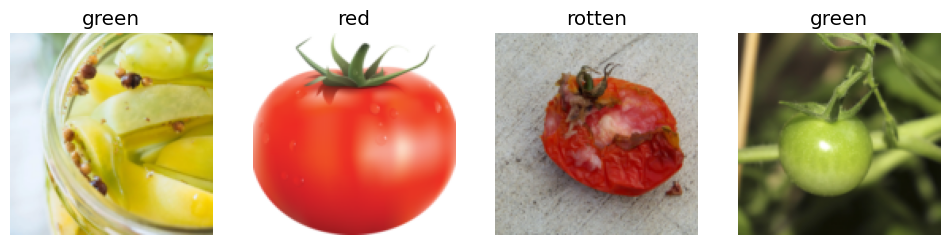

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

By default `Resize` crops the images to fit a square shape of the size requested, using the full width or height. This can result in losing some important details. Alternatively, you can ask fastai to pad the images with zeros (black), or squish/stretch them:

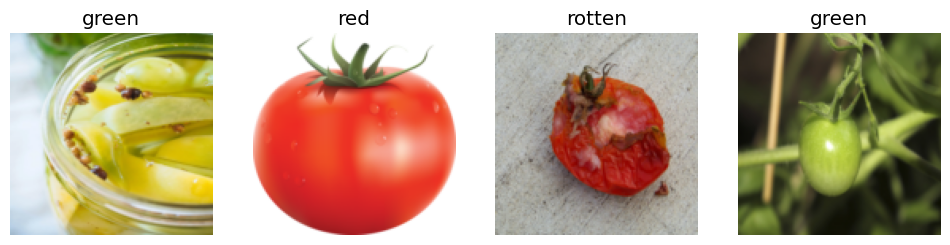

In [ ]:
tomatos = tomatos.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = tomatos.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

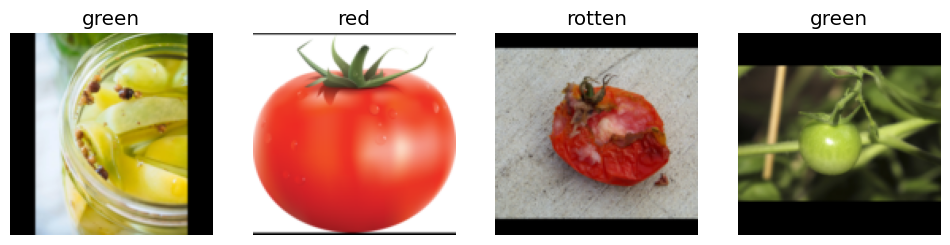

In [ ]:
tomatos = tomatos.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = tomatos.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

All of these approaches seem somewhat wasteful, or problematic. If we squish or stretch the images they end up as unrealistic shapes, leading to a model that learns that things look different to how they actually are, which we would expect to result in lower accuracy. If we crop the images then we remove some of the features that allow us to perform recognition. For instance, if we were trying to recognize breeds of dog or cat, we might end up cropping out a key part of the body or the face necessary to distinguish between similar breeds. If we pad the images then we have a whole lot of empty space, which is just wasted computation for our model and results in a lower effective resolution for the part of the image we actually use.

Instead, what we normally do in practice is to randomly select part of the image, and crop to just that part. On each epoch (which is one complete pass through all of our images in the dataset) we randomly select a different part of each image. This means that our model can learn to focus on, and recognize, different features in our images. It also reflects how images work in the real world: different photos of the same thing may be framed in slightly different ways.

In fact, an entirely untrained neural network knows nothing whatsoever about how images behave. It doesn't even recognize that when an object is rotated by one degree, it still is a picture of the same thing! So actually training the neural network with examples of images where the objects are in slightly different places and slightly different sizes helps it to understand the basic concept of what an object is, and how it can be represented in an image.

Here's another example where we replace Resize with RandomResizedCrop, which is the transform that provides the behavior we just described. The most important parameter to pass in is min_scale, which determines how much of the image to select at minimum each time:

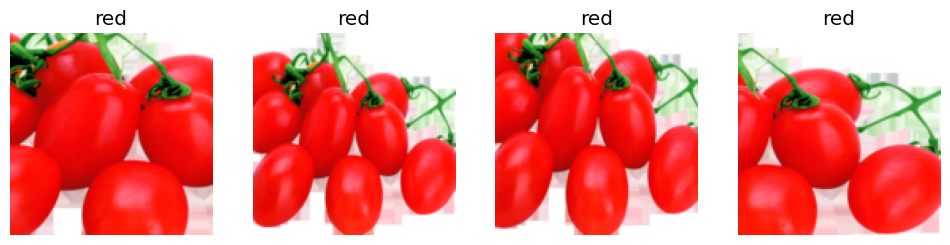

In [ ]:
tomatos = tomatos.new(item_tfms = RandomResizedCrop(128, min_scale=0.3))
dls = tomatos.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

We used unique=True to have the same image repeated with different versions of this RandomResizedCrop transform. This is a specific example of a more general technique, called data augmentation.

**Data Augmentation**

`Data augmentation` refers to creating a random variotions of our input data, such that they appear different, but do not actually change the meaning of the data. Examples of common data augmentation techniques for images are rotation, flipping, prespective warping, brightness changes and contrst changes. For natural photo images such as the ones we are using there, a standard augmentation that we found work pretty well are provided with the `aug_transforms` function. Because our images are now the same size, we can apply these augmentations to an entire batch of them using the GPU, which will save a lot of time. To tell fastai we want to use these transforms on a batch, we use the batch_tfms parameter (note that we're not using RandomResizedCrop in this example, so you can see the differences more clearly; we're also using double the amount of augmentation compared to the default, for the same reason):

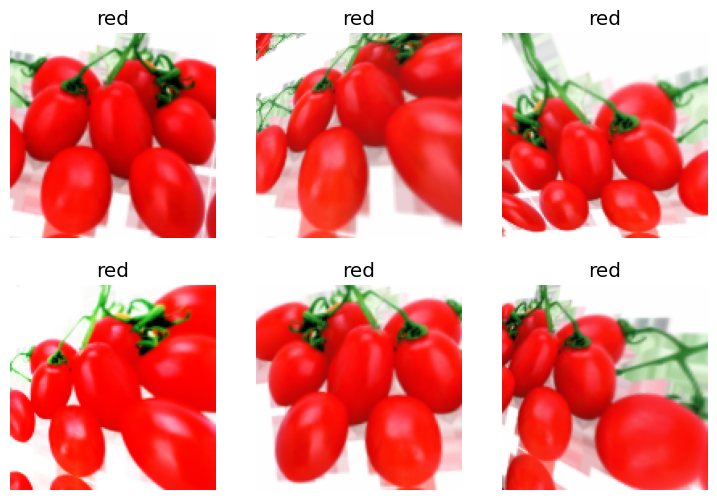

In [ ]:
tomatos = tomatos.new(item_tfms = Resize(128), batch_tfms = aug_transforms(mult=2))
dls = tomatos.dataloaders(path)
dls.train.show_batch(max_n=6, nrows=2, unique=True)

**Training Your Model and Using it to Clean Your Data**

Time to use the same lines of code as in <<chapter_intro>> to train our tomato classifier.

We don't have a lot of data for our problem, so to train our model, we'll use RandomResizedCrop with an image size of 224 px, which is fairly standard for image classification, and default aug_transforms:

In [ ]:
tomatos = tomatos.new(
    item_tfms = RandomResizedCrop(224, min_scale=0.5),
    batch_tfms = aug_transforms())
dls = tomatos.dataloaders(path)

We can now create our `Learner` and fine-tune it in the usual way:

In [ ]:
learn = vision_learner(dls, resnet18, metrics = error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 201MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.580360,0.482459,0.141593,00:35


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.613937,0.397928,0.123894,00:32
1,0.484892,0.369377,0.097345,00:24
2,0.377350,0.372703,0.088496,00:25
3,0.325502,0.367717,0.097345,00:24


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Now let's see whether the mistakes the model is making are mainly thinking that red are green (that would be bad for safety!), or that red are rotten tomatos, or something else. To visualize this, we can create a confusion matrix:

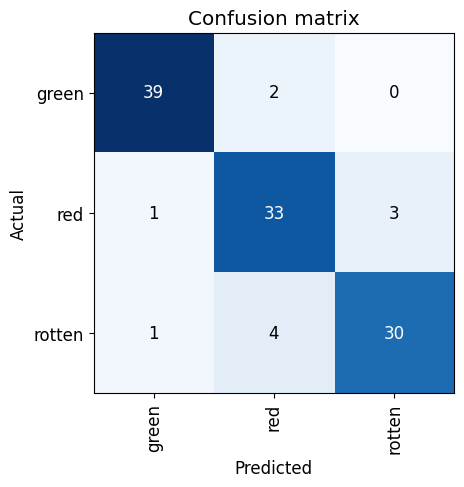

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

The rows represent all the green, red, and rotten tomatos in our dataset, respectively. The columns represent the images which the model predicted as green, red, and rotten tomatos, respectively. Therefore, the diagonal of the matrix shows the images which were classified correctly, and the off-diagonal cells represent those which were classified incorrectly. This is one of the many ways that fastai allows you to view the results of your model. It is (of course!) calculated using the validation set. With the color-coding, the goal is to have white everywhere except the diagonal, where we want dark blue. Our bear classifier isn't making many mistakes!

It's helpful to see where exactly our errors are occurring, to see whether they're due to a dataset problem (e.g., images that aren't bears at all, or are labeled incorrectly, etc.), or a model problem (perhaps it isn't handling images taken with unusual lighting, or from a different angle, etc.). To do this, we can sort our images by their loss.

The loss is a number that is higher if the model is incorrect (especially if it's also confident of its incorrect answer), or if it's correct, but not confident of its correct answer. In a couple of chapters we'll learn in depth how loss is calculated and used in the training process. For now, plot_top_losses shows us the images with the highest loss in our dataset. As the title of the output says, each image is labeled with four things: prediction, actual (target label), loss, and probability. The probability here is the confidence level, from zero to one, that the model has assigned to its prediction:

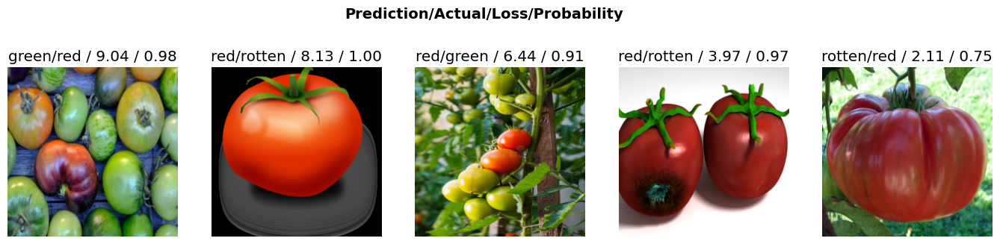

In [ ]:
interp.plot_top_losses(5, nrows=1, figsize=(17,4))

This output shows that the image with the highest loss is one that has been predicted as "grizzly" with high confidence. However, it's labeled (based on our Bing image search) as "black." We're not bear experts, but it sure looks to us like this label is incorrect! We should probably change its label to "grizzly."

The intuitive approach to doing data cleaning is to do it before you train a model. But as you've seen in this case, a model can actually help you find data issues more quickly and easily. So, we normally prefer to train a quick and simple model first, and then use it to help us with data cleaning.

fastai includes a handy GUI for data cleaning called ImageClassifierCleaner that allows you to choose a category and the training versus validation set and view the highest-loss images (in order), along with menus to allow images to be selected for removal or relabeling:

ADPAT THE TEXT!!!!!!!!!!!!!!!!

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

# 3. Turning Your Model into an Online Application

**Using the Model for Inference**

Once you've got a model you're happy with, you need to save it, so that you can then copy it over to a server where you'll use it in production. Remember that a model consists of two parts: the architecture and the trained parameters. The easiest way to save the model is to save both of these, because that way when you load a model you can be sure that you have the matching architecture and parameters. To save both parts, use the export method.

This method even saves the definition of how to create your DataLoaders. This is important, because otherwise you would have to redefine how to transform your data in order to use your model in production. fastai automatically uses your validation set DataLoader for inference by default, so your data augmentation will not be applied, which is generally what you want.

When you call export, fastai will save a file called "export.pkl":

In [ ]:
learn.export()

Let's check that the file exists, by using the ls method that fastai adds to Python's Path class:

In [ ]:
path = Path()
path.ls(file_exts=".pkl")

(#1) [Path('export.pkl')]

You'll need this file wherever you deploy your app to. For now, let's try to create a simple app within our notebook.

When we use a model for getting predictions, instead of training, we call it inference. To create our inference learner from the exported file, we use load_learner (in this case, this isn't really necessary, since we already have a working Learner in our notebook; we're just doing it here so you can see the whole process end-to-end):

In [ ]:
learn_inf = load_learner(path/"export.pkl")

When we're doing inference, we're generally just getting predictions for one image at a time. To do this, pass a filename to predict:

In [ ]:
learn_inf.predict("images/red.jpg")

('red', tensor(1), tensor([1.9179e-03, 9.9784e-01, 2.4612e-04]))

This has returned three things: the predicted category in the same format you originally provided (in this case that's a string), the index of the predicted category, and the probabilities of each category. The last two are based on the order of categories in the vocab of the DataLoaders; that is, the stored list of all possible categories. At inference time, you can access the DataLoaders as an attribute of the Learner:

In [ ]:
learn_inf.dls.vocab

['green', 'red', 'rotten']

**Creating a Notebook App from the Model**

In [ ]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

Now we can grab the image

In [ ]:
# For the book, we can´t actually click an upload bitto, so we fake it
btn_upload = SimpleNamespace(data = ["images/red.jpg"])

In [ ]:
img = PILImage.create(btn_upload.data[-1])

We can use Output widget to display it:

In [ ]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

Then we can get our predictions: 

In [ ]:
pred,pred_idx,probs = learn_inf.predict(img)

and use a Label to display them:

In [ ]:
lbl_pred = widgets.Label()
lbl_pred.value = f"Prediction: {pred}; Probability: {probs[pred_idx]:.04f}"
lbl_pred

Label(value='Prediction: red; Probability: 0.9978')

We´ll need a button to do the classification. It loooks exactly like the upload button:

In [ ]:
btn_run = widgets.Button(description = "Classify")
btn_run

Button(description='Classify', style=ButtonStyle())

We'll also need a click event handler; that is, a function that will be called when it's pressed. We can just copy over the lines of code from above:

In [ ]:

def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

You can test the button now by pressing it, and you should see the image and predictions update automatically!

We can now put them all in a vertical box (VBox) to complete our GUI:

In [ ]:
btn_upload = widgets.FileUpload()

In [ ]:
VBox([widgets.Label("Select your tomato!"),
      btn_upload, btn_run, out_pl, lbl_pred])

We have written all the code necessary for our app. The next step is to convert it into something we can deploy.

**Turning Your Notebook into a Real App**

In [ ]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila 
     

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 50.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.4/90.4 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 8.3 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.27.1
    Uninstalling requests-2.27.1:
      Successfully uninstalled requests-2.27.1
  Attempting uninstall: jsonschema
    Found existing installation: jsonschema 4.3.3
    Uninstalling jsonschema-4.3.3:
      Successfully uninstalled jsonschema-4.3.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency confl

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila 0.4.0 OK


In [ ]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila 0.4.0 OK
